<a href="https://colab.research.google.com/github/priya-200/Blog/blob/master/Copy_of_Dog_Breed_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🐶 End-to-end Multil-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

## 1. Problem

Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

## 2. Data

The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).


## Getting workspace Ready

* Importing tensorflow and update it to latest version
* Import tensorflow hub
* Make sure we are usig GPU

In [ ]:
#!pip install --upgrade tensorflow
#!pip install --upgrade tensorflow_hub

In [ ]:
#!unzip "/content/drive/MyDrive/Kaggle/Dog breed classification/dog-breed-identification.zip" -d "/content/drive/MyDrive/Kaggle/Dog Breed machine learning"

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
#Importing Tensorflow

import tensorflow as tf
print("TensorFlow Version:",tf.__version__)

TensorFlow Version: 2.15.0


In [ ]:
# Importing Tensorflow hub

import tensorflow_hub as hub
print("Tensorflow hub version:",hub.__version__)

Tensorflow hub version: 0.16.1


In [ ]:
#Checking GPU availability

print("GPU", "available (YESSSS!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :(")

GPU available (YESSSS!!!!!)


## Convert the unstructed data into tensors to work with tensorflow framework


> Let's checkout the label.csv from the path



In [ ]:
label_csv = pd.read_csv('/content/drive/MyDrive/Kaggle/Dog Breed machine learning/labels.csv')
label_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
label_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
komondor                 67
brabancon_griffon        67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

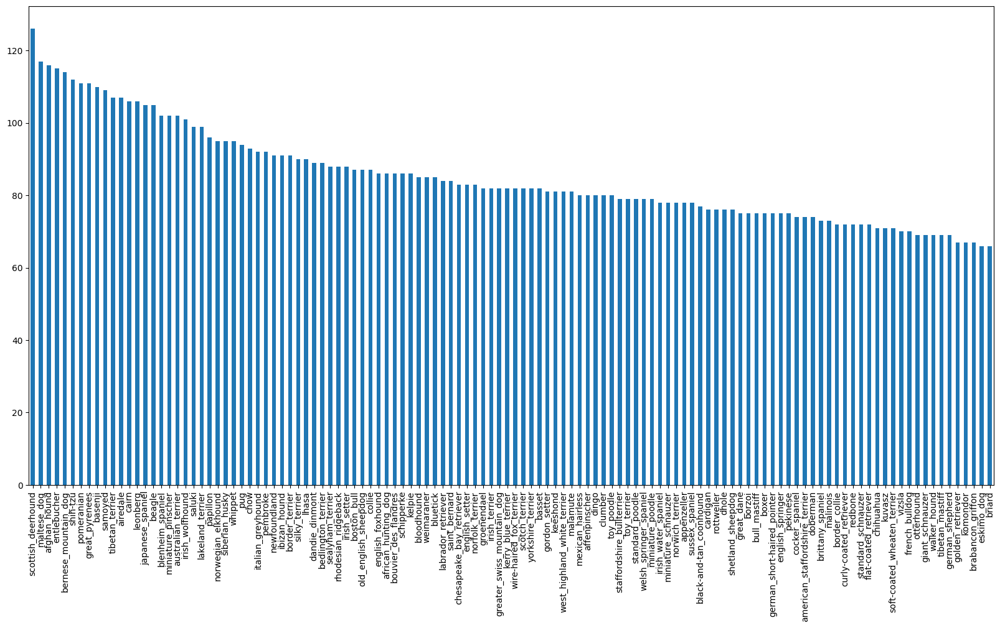

In [ ]:
label_csv['breed'].value_counts().plot(kind='bar',figsize=(20,10));

In [ ]:
# On an average there are 82 images of each dog breed

label_csv['breed'].value_counts().median()

82.0

silky_terrier


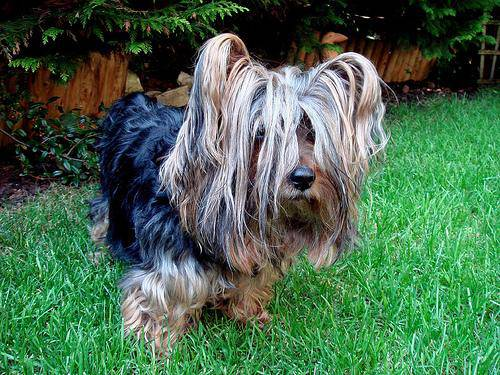

In [ ]:
import random
i = random.randint(0,len(label_csv))
random_name = label_csv['id'][i]
from IPython.display import Image
print(f'{label_csv["breed"][i]}')
Image(f"/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/{random_name}.jpg")

In [ ]:
## Getting the filenames from the label csv

filename = [f"/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/{fname}.jpg" for fname in label_csv['id']]

# Viewing first 10 filename

filename[:5],len(filename)

(['/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
  '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
  '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/001cdf01b096e06d78e9e5112d419397.jpg',
  '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
  '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/0021f9ceb3235effd7fcde7f7538ed62.jpg'],
 10222)

In [ ]:
# Check if the no.of files in the train set is equall to the no.of filenames this is to avoid further confussion

import os
if len(os.listdir('/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/')) == len(filename):
  print("Procced Further there are no confussion in our dataset")
else:
  print("Check the dataset that we have downloaded")

Procced Further there are no confussion in our dataset


In [ ]:
len(os.listdir('/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train'))

10222

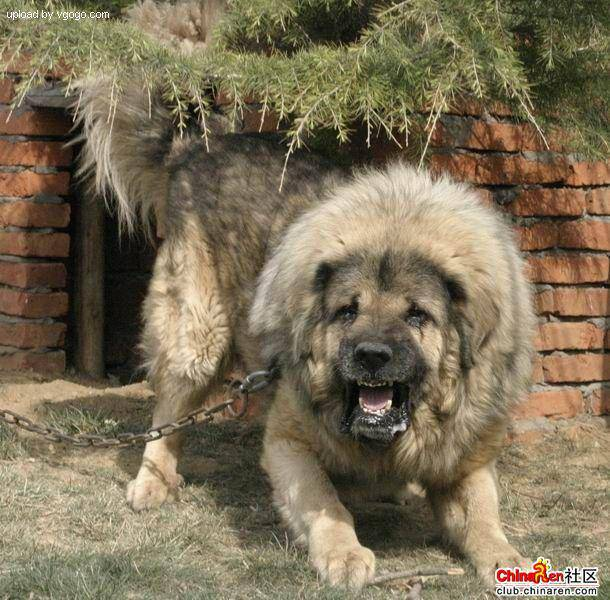

In [ ]:
Image(filename[9000])

In [ ]:
# To create the labels for the dataset

labels = label_csv['breed'].to_numpy()
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
# Check if the length of numpy object is same as number of filenames so to check if there are any missing values

if len(labels) == len(filename):
  print(len(labels),'The number matches!! Procced Further')
else:
  print("There are missing values in our datset check for it")

10222 The number matches!! Procced Further


In [ ]:
# Find the unique breeds

unique_labels = np.unique(labels)
unique_labels

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_labels)

120

In [ ]:
labels[0] == unique_labels

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turning the labels into the boolean labels

boolean_labels = [unique_labels == label for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
boolean_labels[0].astype(int)

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

## Creating our own validation set

In [ ]:
# Setting up the values of X and y

X = filename
y = boolean_labels

In [ ]:
# we're going to exprment with ~1000 data and the go ahead increasing the data

# Set the number of images to start with

NUM_IMAGES = 1000 #@param {type:'slider',min:1000,max:10000,step:1000}

In [ ]:
# Let's split our data into train and validation

np.random.seed(42)
from sklearn.model_selection import train_test_split
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],
                                               y[:NUM_IMAGES],
                                               test_size=0.2)

In [ ]:
len(X_train),len(y_train),len(X_val),len(y_val)

(800, 800, 200, 200)

In [ ]:
filename[:2]

['/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg']

# Preprocessing images(Turning images into tensors)

array([[[110, 109, 114],
        [113, 112, 117],
        [117, 118, 122],
        ...,
        [ 39,  33,  33],
        [ 37,  31,  31],
        [ 35,  29,  29]],

       [[110, 109, 114],
        [113, 112, 117],
        [117, 118, 122],
        ...,
        [ 40,  34,  34],
        [ 38,  32,  32],
        [ 35,  29,  29]],

       [[108, 107, 112],
        [112, 111, 116],
        [117, 118, 122],
        ...,
        [ 42,  36,  36],
        [ 39,  33,  33],
        [ 36,  30,  30]],

       ...,

       [[148, 161, 169],
        [147, 160, 168],
        [142, 155, 161],
        ...,
        [138, 136, 149],
        [140, 136, 151],
        [140, 136, 153]],

       [[141, 154, 162],
        [141, 154, 162],
        [138, 151, 157],
        ...,
        [133, 130, 147],
        [133, 128, 148],
        [135, 127, 148]],

       [[134, 147, 155],
        [136, 149, 157],
        [135, 148, 154],
        ...,
        [144, 141, 158],
        [147, 139, 162],
        [150, 142, 165]]], dtype=uint8)
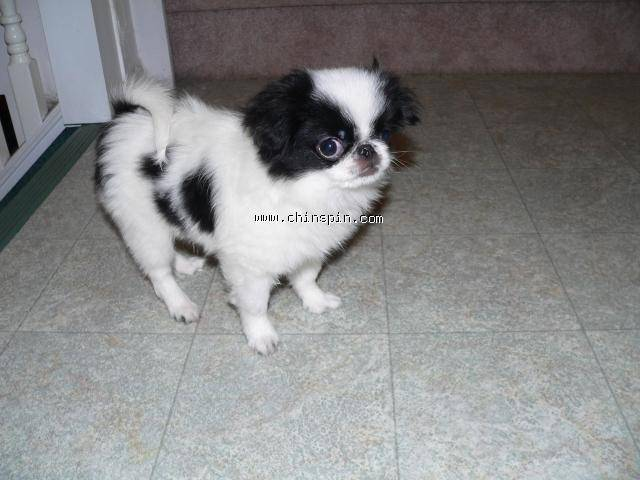

In [ ]:
# Converting a single image into numbers
index = random.randint(0,10022)
from matplotlib.pyplot import imread
image = imread(filename[index])
image

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 640, 3), dtype=uint8, numpy=
array([[[110, 109, 114],
        [113, 112, 117],
        [117, 118, 122],
        ...,
        [ 39,  33,  33],
        [ 37,  31,  31],
        [ 35,  29,  29]],

       [[110, 109, 114],
        [113, 112, 117],
        [117, 118, 122],
        ...,
        [ 40,  34,  34],
        [ 38,  32,  32],
        [ 35,  29,  29]]], dtype=uint8)>

In [ ]:
# Defining a function

IMG_SIZE = 244

def preprocess_image(path):

  # Read the image
  image = tf.io.read_file(path)
  # Turning the image into tensors with 3 color channel
  image = tf.image.decode_jpeg(image,channels = 3)
  # Convert the color channel in the range 0 to 1
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize our image
  image = tf.image.resize(image,size = [IMG_SIZE,IMG_SIZE])

  return image

In [ ]:
image = tf.io.read_file('/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg')
image

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01w\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
image = tf.image.decode_jpeg(image,channels = 3)
image

<tf.Tensor: shape=(375, 500, 3), dtype=uint8, numpy=
array([[[107,  45,   0],
        [151,  91,  41],
        [177, 119,  69],
        ...,
        [175, 143,  68],
        [189, 157,  82],
        [213, 181, 106]],

       [[150,  92,  46],
        [179, 121,  75],
        [164, 110,  63],
        ...,
        [167, 136,  56],
        [171, 140,  60],
        [187, 156,  76]],

       [[150,  97,  55],
        [187, 136,  93],
        [161, 112,  69],
        ...,
        [199, 168,  78],
        [193, 162,  72],
        [200, 169,  79]],

       ...,

       [[188, 121,  66],
        [185, 118,  63],
        [182, 117,  63],
        ...,
        [213, 160, 106],
        [211, 158, 104],
        [208, 155, 101]],

       [[185, 118,  63],
        [183, 116,  61],
        [182, 117,  63],
        ...,
        [196, 144,  86],
        [199, 147,  90],
        [199, 147,  89]],

       [[181, 114,  59],
        [181, 114,  59],
        [181, 116,  62],
        ...,
        [184, 132,  7

In [ ]:
image = tf.image.convert_image_dtype(image,tf.float32)
image

<tf.Tensor: shape=(375, 500, 3), dtype=float32, numpy=
array([[[0.41960788, 0.1764706 , 0.        ],
        [0.5921569 , 0.35686275, 0.16078432],
        [0.69411767, 0.4666667 , 0.27058825],
        ...,
        [0.6862745 , 0.56078434, 0.26666668],
        [0.7411765 , 0.6156863 , 0.32156864],
        [0.8352942 , 0.70980394, 0.4156863 ]],

       [[0.5882353 , 0.36078432, 0.18039216],
        [0.7019608 , 0.47450984, 0.29411766],
        [0.6431373 , 0.43137258, 0.24705884],
        ...,
        [0.654902  , 0.53333336, 0.21960786],
        [0.67058825, 0.54901963, 0.23529413],
        [0.73333335, 0.6117647 , 0.29803923]],

       [[0.5882353 , 0.3803922 , 0.21568629],
        [0.73333335, 0.53333336, 0.3647059 ],
        [0.6313726 , 0.43921572, 0.27058825],
        ...,
        [0.7803922 , 0.65882355, 0.30588236],
        [0.7568628 , 0.63529414, 0.28235295],
        [0.7843138 , 0.6627451 , 0.30980393]],

       ...,

       [[0.7372549 , 0.47450984, 0.25882354],
        [0.72

In [ ]:
image = tf.image.resize(image,size = [224,224])
image

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.5705322 , 0.33588538, 0.15008473],
        [0.66901225, 0.4601166 , 0.26022965],
        [0.61062384, 0.43763596, 0.21601713],
        ...,
        [0.8182312 , 0.7297958 , 0.26963907],
        [0.72454786, 0.6059109 , 0.2653059 ],
        [0.7494603 , 0.6252918 , 0.32456532]],

       [[0.6761415 , 0.4733761 , 0.30642927],
        [0.5672121 , 0.38192675, 0.20349538],
        [0.5883547 , 0.4322571 , 0.2403155 ],
        ...,
        [0.9326942 , 0.8260503 , 0.41093278],
        [0.86072475, 0.74250627, 0.3694122 ],
        [0.76781666, 0.6461604 , 0.29291284]],

       [[0.46350825, 0.29595745, 0.1536156 ],
        [0.42554107, 0.27039403, 0.12009468],
        [0.7887875 , 0.6547362 , 0.49015   ],
        ...,
        [0.89372385, 0.7696401 , 0.41811958],
        [0.88609535, 0.7585918 , 0.36495727],
        [0.8243601 , 0.69494826, 0.2930575 ]],

       ...,

       [[0.7344025 , 0.4716574 , 0.2559711 ],
        [0.71

## Turning our data into batch size


> In order to use tensorflow efficiently we need our data to be in a tupple form like `(image,label)` and batch them



  



In [ ]:
## Create a simple function that returns a tuple '(image,label)'

def get_image_label(image_path,label):
  image = preprocess_image(image_path)
  return image,label

In [ ]:
get_image_label(X[42],y[42])

(<tf.Tensor: shape=(244, 244, 3), dtype=float32, numpy=
 array([[[0.33240733, 0.528404  , 0.32877645],
         [0.26302028, 0.454124  , 0.25184554],
         [0.24322662, 0.43179044, 0.22709224],
         ...,
         [0.29380426, 0.52090865, 0.32451057],
         [0.29776222, 0.52521324, 0.33200315],
         [0.29484236, 0.5222934 , 0.33405805]],
 
        [[0.26853722, 0.46210465, 0.27810386],
         [0.24625303, 0.4426449 , 0.25299522],
         [0.2679708 , 0.4562061 , 0.2626349 ],
         ...,
         [0.28107235, 0.50784814, 0.3127341 ],
         [0.28670043, 0.51383805, 0.3265429 ],
         [0.2895012 , 0.5166388 , 0.3293437 ]],
 
        [[0.21171938, 0.41078815, 0.25436452],
         [0.23509896, 0.43457666, 0.27692637],
         [0.28364372, 0.47278884, 0.3107396 ],
         ...,
         [0.26476204, 0.49106047, 0.3046848 ],
         [0.27449086, 0.4980203 , 0.32259437],
         [0.28086528, 0.5043947 , 0.3289688 ]],
 
        ...,
 
        [[0.0082752 , 0.04095767

In [ ]:
## Make a function to turn all of our data X and y into batches

BATCH_SIZE = 32

# Create a function to turn into batches

def create_data_batches(X,y=None,batch_size=BATCH_SIZE,val_data = False,test_data = False):
  '''
  Create batches of data out of image X and label y pairs
  Shuffle the data if it's training data but doesn't shuffle if it is a validation data,
  Also accept test data as input(no labels).
  '''
  # If the data is a test data we won't have labels

  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) # Only file paths
    data_batch = data.map(preprocess_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a validation dataset we don't need to shuffle

  if val_data:
    print("Creating validation dataset...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  #Creating training dataset

  else:
    print("Creating Training dataset...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data= data.map(get_image_label)
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [ ]:
train_data = create_data_batches(X = X_train,y = y_train)
val_data = create_data_batches(X = X_val, y = y_val, val_data = True)

Creating Training dataset...
Creating validation dataset...


In [ ]:
## Check the different attributes of the batches

train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 244, 244, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 244, 244, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [ ]:
train_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 244, 244, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
## Visualize the data

def show_25_image(images,label):
  plt.figure(figsize=(16,16))
  for i in range(25):
    # Create the subplots
    ax = plt.subplot(5,5,i+1)
    # Display the image
    plt.imshow(images[i])
    # Add image label as the title
    plt.title(unique_labels[label[i].argmax()])
    # Off the axis
    plt.axis("off")

In [ ]:
train_images , train_labels = next(train_data.as_numpy_iterator())
train_images[:1],train_labels[:1]

(array([[[[0.04334844, 0.08256412, 0.05119157],
          [0.04058313, 0.07979881, 0.04842626],
          [0.04805213, 0.08726782, 0.05589527],
          ...,
          [0.04932982, 0.0767808 , 0.04540826],
          [0.04041313, 0.06786412, 0.03649157],
          [0.02814437, 0.05559535, 0.0242228 ]],
 
         [[0.02226104, 0.06147673, 0.02694603],
          [0.02596024, 0.06517592, 0.03064523],
          [0.03778528, 0.07700097, 0.04247027],
          ...,
          [0.0343912 , 0.06184218, 0.03046963],
          [0.0307619 , 0.05821288, 0.02684033],
          [0.03566916, 0.06312014, 0.03174759]],
 
         [[0.01773229, 0.05694798, 0.02165386],
          [0.02396994, 0.06318563, 0.02789151],
          [0.0413854 , 0.0806011 , 0.04530697],
          ...,
          [0.04627964, 0.07373062, 0.04235807],
          [0.02898427, 0.05643526, 0.0250627 ],
          [0.04562837, 0.07307935, 0.04170679]],
 
         ...,
 
         [[0.37955227, 0.494631  , 0.26574963],
          [0.32480

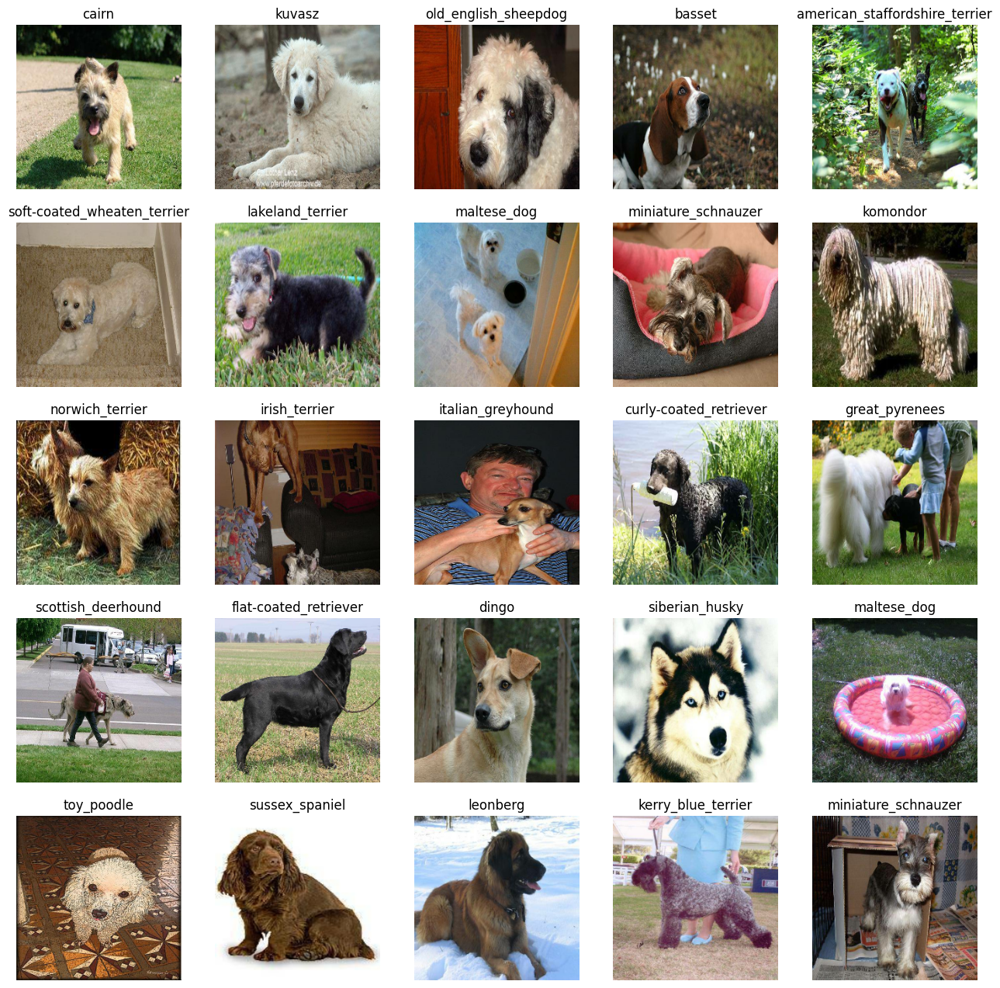

In [ ]:
show_25_image(train_images,train_labels)

## Building a model

Befor building a model there are tons of models existing and train the model in our dataset

##Requirnments:
* Input shape (in form of tensors) to our model
* Output shape (in form of tensors) to our model
* URL That we are going to use

In [ ]:
## Setup input shape to our model

INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3] # Height,width,color channels

## Setup output shape to our model

OUTPUT_SHAPE = len(unique_labels)

## Setup model url from tensorflow hub

MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

## For my practice

In [ ]:
tf.random.set_seed(42)

model_1 = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(244, 244, 3)),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(units = 100,activation = 'sigmoid'),
    tf.keras.layers.Dense(units = 100,activation = 'sigmoid'),
    tf.keras.layers.Dense(units = 100,activation = 'sigmoid'),
    #tf.keras.layers.Dense(units = 100,activation = 'sigmoid'),
    tf.keras.layers.Dense(units = 120, activation = 'softmax')
])

model_1.compile(
    loss = tf.keras.losses.CategoricalCrossentropy(),
    optimizer = tf.keras.optimizers.Adam(),
    metrics = ['accuracy']
)

model_1.fit(train_images,train_labels,epochs = 500)

Epoch 1/500
1/1 [==============================] - 2s 2s/step - loss: 4.9234 - accuracy: 0.0000e+00
Epoch 2/500
1/1 [==============================] - 0s 29ms/step - loss: 4.7849 - accuracy: 0.0000e+00
Epoch 3/500
1/1 [==============================] - 0s 33ms/step - loss: 4.6985 - accuracy: 0.0000e+00
Epoch 4/500
1/1 [==============================] - 0s 26ms/step - loss: 4.6111 - accuracy: 0.0000e+00
Epoch 5/500
1/1 [==============================] - 0s 24ms/step - loss: 4.5303 - accuracy: 0.0000e+00
Epoch 6/500
1/1 [==============================] - 0s 24ms/step - loss: 4.4518 - accuracy: 0.0312
Epoch 7/500
1/1 [==============================] - 0s 25ms/step - loss: 4.3785 - accuracy: 0.0312
Epoch 8/500
1/1 [==============================] - 0s 25ms/step - loss: 4.3079 - accuracy: 0.0312
Epoch 9/500
1/1 [==============================] - 0s 24ms/step - loss: 4.2410 - accuracy: 0.0312
Epoch 10/500
1/1 [==============================] - 0s 27ms/step - loss: 4.1770 - accuracy: 0.0312
E

In [ ]:
train_images[:1].shape

(1, 244, 244, 3)

In [ ]:
train_labels[:1].shape

(1, 120)

In [ ]:
val_images,val_labels = next(val_data.as_numpy_iterator())

In [ ]:
model_1.evaluate(val_images,val_labels)

1/1 [==============================] - 0s 169ms/step - loss: 9.5203 - accuracy: 0.0000e+00


[9.520259857177734, 0.0]

## Create model function

In [ ]:
import tensorflow_hub as hub

def create_model(input_shape=(224, 224, 3), output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
    print("Building model with:", model_url)

    # Setup the model layers
    model = tf.keras.Sequential([
        tf.keras.layers.Input(shape=(None, None, 3)),  # Variable input shape
        tf.keras.layers.Lambda(lambda x: tf.image.resize(x, (224, 224))),  # Resize images
        hub.KerasLayer(model_url),  # Layer 1 (input layer)
        tf.keras.layers.Dense(units=output_shape, activation="softmax")  # Layer 2 (output layer)
    ])

    # Compile the model
    model.compile(
        loss=tf.keras.losses.CategoricalCrossentropy(),
        optimizer=tf.keras.optimizers.Adam(),
        metrics=["accuracy"]
    )

    return model


In [ ]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda (Lambda)             (None, 224, 224, 3)       0         
                                                                 
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense_4 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
## Creating callbacks

%load_ext tensorboard

In [ ]:
import datetime

## Create a function to build tensorboar callback
def create_tensorboard_callback():
  # Create log directory to store the logs
  logdir = os.path.join("/content/drive/MyDrive/Kaggle/Dog breed classification/logs",datetime.datetime.now().strftime("%y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
### Create eairly stoping callback

early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy",
                                                  patience = 3)

### Training a model

Our first model is only going to train on 1000 of the images to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param{type:"slider",min:10,max:100,step:10}

In [ ]:
def train_model():
  model = create_model()

  #create new tensorboard session everytime we train the model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it

  model.fit(x = train_data,epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard,early_stopping]
            )
  return model

In [ ]:
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 263s 9s/step - loss: 4.5194 - accuracy: 0.0825 - val_loss: 3.4782 - val_accuracy: 0.2150
Epoch 2/100
25/25 [==============================] - 4s 154ms/step - loss: 1.5914 - accuracy: 0.7025 - val_loss: 2.2591 - val_accuracy: 0.4800
Epoch 3/100
25/25 [==============================] - 6s 224ms/step - loss: 0.5614 - accuracy: 0.9413 - val_loss: 1.7886 - val_accuracy: 0.5500
Epoch 4/100
25/25 [==============================] - 4s 165ms/step - loss: 0.2568 - accuracy: 0.9875 - val_loss: 1.5942 - val_accuracy: 0.6400
Epoch 5/100
25/25 [==============================] - 4s 144ms/step - loss: 0.1496 - accuracy: 0.9975 - val_loss: 1.5339 - val_accuracy: 0.6250
Epoch 6/100
25/25 [==============================] - 6s 223ms/step - loss: 0.1024 - accuracy: 0.9987 - val_loss: 1.4860 - val_accuracy: 0.6500
Epoch 7/100
25/25 [==============================]

In [ ]:
## checking the tensorboard logs

%tensorboard --logdir /content/drive/MyDrive/Kaggle/Dog\ breed\ classification/logs

<IPython.core.display.Javascript object>

#Making and evaluating prediction using trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 244, 244, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data,verbose = 1)
predictions

7/7 [==============================] - 1s 109ms/step


array([[2.05387524e-03, 1.81997355e-04, 5.12176950e-04, ...,
        1.83419703e-04, 6.74424955e-05, 3.90358418e-02],
       [9.50410089e-04, 1.27333356e-03, 6.78429892e-03, ...,
        2.86977942e-04, 4.30478994e-03, 1.65201491e-04],
       [2.16873261e-04, 3.84960033e-04, 2.39390993e-05, ...,
        4.78669608e-06, 8.41022411e-05, 6.91719833e-05],
       ...,
       [1.84859455e-05, 1.10194625e-04, 4.11217473e-03, ...,
        3.81632090e-05, 2.59355409e-04, 3.78969824e-04],
       [3.26008443e-03, 8.29890196e-04, 5.60531742e-04, ...,
        3.03233654e-04, 3.72715804e-05, 8.27076659e-03],
       [1.44755968e-03, 4.02661535e-05, 5.57258551e-04, ...,
        3.18780984e-03, 1.13160138e-04, 5.67860552e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val),len(unique_labels)

(200, 120)

In [ ]:
unique_labels[predictions[0].argmax()]

'border_terrier'

In [ ]:
y_val[0].argmax()

26

In [ ]:
def get_pred_label(pred_probs):
  return unique_labels[pred_probs.argmax()]

In [ ]:
get_pred_label(predictions[21])

'samoyed'

In [ ]:
y_val

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
val_images = []
val_labels = []

for image,label in val_data.unbatch().as_numpy_iterator():
  val_images.append(image)
  val_labels.append(label)

In [ ]:
val_images[0],val_labels[0]

(array([[[0.28828523, 0.4285456 , 0.30037943],
         [0.2816185 , 0.35731632, 0.2515491 ],
         [0.3123403 , 0.29512718, 0.23849115],
         ...,
         [0.790264  , 0.83544725, 0.82226336],
         [0.815871  , 0.8284931 , 0.84148055],
         [0.82066065, 0.8260836 , 0.8418217 ]],
 
        [[0.23985186, 0.33131763, 0.20917843],
         [0.31752995, 0.35682982, 0.25751287],
         [0.36611375, 0.33565587, 0.2682835 ],
         ...,
         [0.7614215 , 0.8055231 , 0.8054749 ],
         [0.74591357, 0.765196  , 0.78011894],
         [0.76036644, 0.77469593, 0.79539007]],
 
        [[0.30969512, 0.3326798 , 0.22578003],
         [0.27431998, 0.26912585, 0.17736274],
         [0.35327896, 0.3091463 , 0.2400284 ],
         ...,
         [0.78222555, 0.8243902 , 0.83760136],
         [0.7783309 , 0.8084659 , 0.83822024],
         [0.7502528 , 0.7749201 , 0.80969185]],
 
        ...,
 
        [[0.98107994, 0.9916071 , 0.93928474],
         [0.99540186, 0.99922997, 0.94595

In [ ]:
def unbatchify(data):
  images = []
  labels = []
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_labels[label.argmax()])
  return images,labels

In [ ]:
val_image,val_label = unbatchify(val_data)
val_label

['cairn',
 'scotch_terrier',
 'basset',
 'bluetick',
 'airedale',
 'bedlington_terrier',
 'keeshond',
 'old_english_sheepdog',
 'saint_bernard',
 'border_collie',
 'yorkshire_terrier',
 'border_collie',
 'yorkshire_terrier',
 'whippet',
 'english_foxhound',
 'standard_poodle',
 'irish_setter',
 'african_hunting_dog',
 'vizsla',
 'irish_water_spaniel',
 'flat-coated_retriever',
 'samoyed',
 'cairn',
 'blenheim_spaniel',
 'welsh_springer_spaniel',
 'scottish_deerhound',
 'komondor',
 'norwich_terrier',
 'cardigan',
 'dingo',
 'dandie_dinmont',
 'walker_hound',
 'walker_hound',
 'mexican_hairless',
 'eskimo_dog',
 'siberian_husky',
 'welsh_springer_spaniel',
 'doberman',
 'mexican_hairless',
 'kuvasz',
 'labrador_retriever',
 'wire-haired_fox_terrier',
 'english_foxhound',
 'collie',
 'toy_poodle',
 'groenendael',
 'boston_bull',
 'standard_poodle',
 'miniature_poodle',
 'chihuahua',
 'staffordshire_bullterrier',
 'vizsla',
 'norfolk_terrier',
 'pug',
 'bedlington_terrier',
 'affenpinsche

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

In [ ]:
def plot_pred(prediction_probability,labels,images , n=1):
  '''
  view the prediction,ground truth and image for sample n
  '''

  pred_prob,true_label,image = prediction_probability[n],labels[n],images[n]

  pred_label = get_pred_label(pred_prob)

  im = plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  ## change the color of the title on if prediction is right or wrong

  if pred_label == true_label:
    color = "green"
  else:
    color = 'red'

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                  np.max(pred_prob)*100,
                                  true_label
                                  ),color = color)
  return im

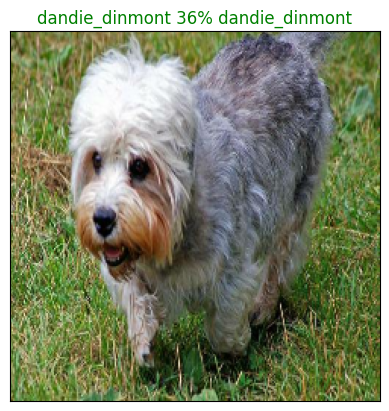

In [ ]:
n = random.randint(0,201)
plot_pred(prediction_probability = predictions,
          labels = val_label,
          images = val_image,
          n = n
          )

In [ ]:
def plot_pred_conf(prediction_probability,labels,n = 1):
  '''
  plot the top 10 highest confidencess along with truth lables for sample n
  '''
  pred_prob, true_label = prediction_probability[n],labels[n]

  pred_label = get_pred_label(pred_prob)

  ## top 10 prediction indexes
  top_10_index = pred_prob.argsort()[-10:][::-1]

  ## Top 10 confidence values
  top_10_pred_vals = pred_prob[top_10_index]

  ##top 10 prediction labels

  top_10_pred_labels = unique_labels[top_10_index]

  ## setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_vals,
                     color = 'grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical"
             )
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass
  return top_plot

<BarContainer object of 10 artists>

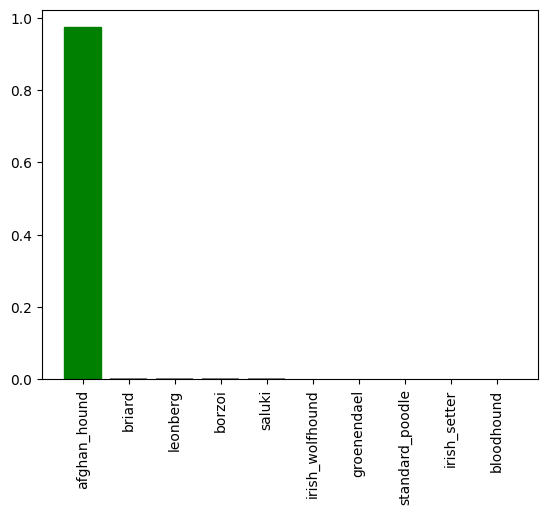

In [ ]:
n = random.randint(0,200)
plot_pred_conf(prediction_probability = predictions,
               labels = val_label,
               n = n)

In [ ]:
unique_labels[predictions[0].argsort()[-10:][::-1]]

array(['border_terrier', 'silky_terrier', 'cairn', 'maltese_dog',
       'irish_wolfhound', 'miniature_schnauzer', 'yorkshire_terrier',
       'lhasa', 'dandie_dinmont', 'standard_schnauzer'], dtype=object)

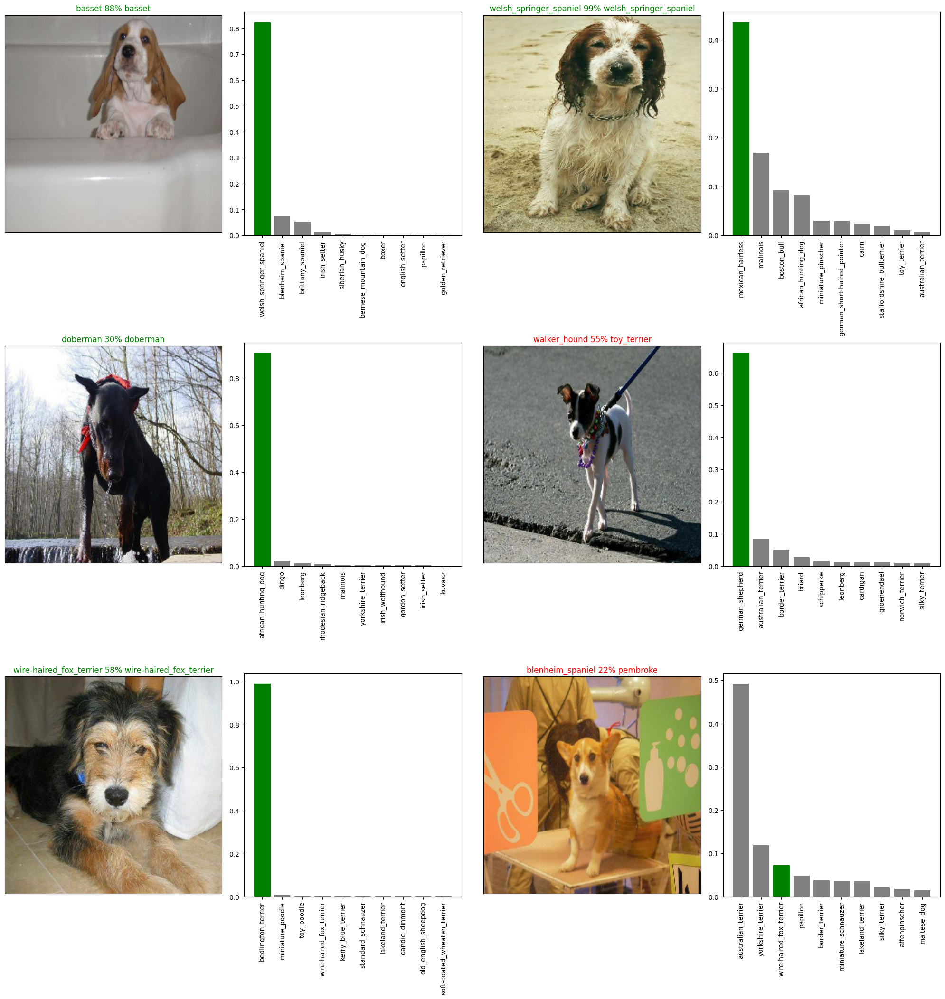

In [ ]:
# Let's check out a few predictions and their different values

num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 7*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probability=predictions,
            labels=val_label,
            images=val_image,
            n=random.randint(0,201))
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probability=predictions,
                 labels=val_label,
                 n=random.randint(0,201))
plt.tight_layout(h_pad=1.0)
plt.show()

### Save our Model

In [ ]:
## Create a function to save a model

def save_model(model,suffix = None):
  '''
  Saves a given model in models direct ory and appends a suffic (string)
  /content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models
  '''

  modeldir = os.path.join("/content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir+ "-" + ".h5" # Save formate for tensorflow
  print(f"Saving model to :{model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
## Load a model

def load_model(model_path):
    """
    Loads a model from the specified path
    """
    print(f"Loading the model from: {model_path}")
    custom_objects = {"KerasLayer": hub.KerasLayer}
    model = tf.keras.models.load_model(model_path, custom_objects=custom_objects)
    return model

In [ ]:
## See if the saving and loading a model work

save_model(model,suffix = "1000-images-mobilenetv2")

Saving model to :/content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models/20240331-042059-.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models/20240331-042059-.h5'

In [ ]:
## Load a trained model

model = load_model('/content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models/20240331-042059-.h5')

Loading the model from: /content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models/20240331-042059-.h5


In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lambda_1 (Lambda)           (None, 224, 224, 3)       0         
                                                                 
 keras_layer_1 (KerasLayer)  (None, 1001)              5432713   
                                                                 
 dense_5 (Dense)             (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 2s 101ms/step - loss: 1.3598 - accuracy: 0.6650


[1.3597639799118042, 0.6650000214576721]

## Training in complete dataset

In [ ]:
len(X),len(y)

(10222, 10222)

In [ ]:
X[:10]

['/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/001cdf01b096e06d78e9e5112d419397.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/002a283a315af96eaea0e28e7163b21b.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/train

In [ ]:
full_data = create_data_batches(X,y)

Creating Training dataset...


In [ ]:
## Create a model for full dataset

full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
## Create full model callbacks

full_model_tensorboard = create_tensorboard_callback()
## No validation set
full_model_earlystopping = tf.keras.callbacks.EarlyStopping(monitor = 'accuracy',patience = 5)

In [ ]:
## Fit the full model

full_model.fit(x = full_data,epochs = NUM_EPOCHS,callbacks = [full_model_tensorboard,full_model_earlystopping])

Epoch 1/100
320/320 [==============================] - 49s 138ms/step - loss: 1.3830 - accuracy: 0.6635
Epoch 2/100
320/320 [==============================] - 40s 125ms/step - loss: 0.4227 - accuracy: 0.8724
Epoch 3/100
320/320 [==============================] - 40s 125ms/step - loss: 0.2546 - accuracy: 0.9284
Epoch 4/100
320/320 [==============================] - 41s 127ms/step - loss: 0.1621 - accuracy: 0.9611
Epoch 5/100
320/320 [==============================] - 40s 126ms/step - loss: 0.1135 - accuracy: 0.9761
Epoch 6/100
320/320 [==============================] - 42s 130ms/step - loss: 0.0799 - accuracy: 0.9873
Epoch 7/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0609 - accuracy: 0.9909
Epoch 8/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0472 - accuracy: 0.9954
Epoch 9/100
320/320 [==============================] - 53s 164ms/step - loss: 0.0370 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 40s 126m

In [ ]:
save_model(full_model,suffix = 'full_model_trained')

Saving model to :/content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models/20240331-045648-.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'/content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models/20240331-045648-.h5'

/content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models/20240331-045648-.h5

In [ ]:
model_1 = load_model('/content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models/20240331-045648-.h5')

Loading the model from: /content/drive/MyDrive/Kaggle/Dog Breed machine learning/Models/20240331-045648-.h5


### Making predictions on test dataset

In [ ]:
## Load test image filenames

import os

test_path = '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/'
test_filenames = [test_path+fname for fname in os.listdir(test_path)]
test_filenames

['/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/e5b43e17eb88bc5e2d6e9d1d04c01a5a.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/e241e149039740594a6af60dc18b269b.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/e3a2e1a4c44509d7aa7777d88c5cd45a.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/e5ded7a736b3336729463af8d74a09c9.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/e12168553b1e0b5e56d5ab6ac8a58984.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/e14cc46044a0fb31554250b07c93bd48.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/e2d65ef41ec9a649c8dbd92f0b821163.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/e2f94ad185a2cfa2311c66c3e8bdba17.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/e46db7bcb804584eed8821ad4e132fd1.jpg',
 '/content/drive/MyDrive/Kaggle/Dog Breed machine learning/test/ddfb44a70

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames,test_data = True)

Creating test data batches....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 244, 244, 3), dtype=tf.float32, name=None)>

In [ ]:
## Make predictions

test_predictions = model_1.predict(test_data,verbose = 1)
test_predictions

In [ ]:
np.savetxt("/content/drive/MyDrive/Kaggle/Dog Breed machine learning/preds_array.csv",test_predictions,delimiter = ",")

In [ ]:
preds_array = np.loadtxt("/content/drive/MyDrive/Kaggle/Dog Breed machine learning/preds_array.csv", delimiter=",")

In [ ]:
## converting it into kaggle submission form

pred_df = pd.DataFrame(columns = ["id"]+list(unique_labels))

In [ ]:
## Append tet ids to the pred_df

test_ids = [path.split('/')[7].split('.')[0] for path in test_filenames]
pred_df['id'] = test_ids

In [ ]:
pred_df[list(unique_labels)] = preds_array

In [ ]:
pred_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e5b43e17eb88bc5e2d6e9d1d04c01a5a,8.061626e-11,2.936814e-14,1.802267e-11,4.360834e-14,7.491245e-12,1.901428e-12,4.056631e-12,1.361621e-09,1.545787e-13,...,5.393628e-14,2.227890e-11,1.289974e-11,1.319630e-12,8.578225e-13,1.907991e-14,7.953595e-12,1.535271e-10,2.419713e-11,6.090232e-13
1,e241e149039740594a6af60dc18b269b,1.874529e-09,3.602727e-09,2.089373e-10,2.411664e-11,3.490642e-14,4.549409e-10,1.417500e-09,1.456324e-10,3.485576e-12,...,5.574091e-04,1.136487e-08,5.954389e-09,4.207058e-10,4.143393e-09,8.266251e-13,2.101616e-09,4.195346e-12,2.265028e-09,3.549173e-09
2,e3a2e1a4c44509d7aa7777d88c5cd45a,3.493708e-09,2.272362e-10,5.065548e-12,3.762703e-11,7.431591e-12,5.515664e-10,1.008458e-10,1.531866e-11,5.648199e-10,...,3.136600e-09,1.363307e-11,7.147850e-11,1.917934e-11,1.359490e-11,1.050980e-04,1.443363e-10,2.451516e-12,2.872809e-10,8.357393e-07
3,e5ded7a736b3336729463af8d74a09c9,7.088457e-12,2.223886e-11,4.316129e-08,1.317838e-10,3.900085e-12,1.243897e-05,2.111833e-10,4.100103e-10,8.853261e-13,...,4.927300e-13,2.121204e-08,6.805877e-11,2.198195e-11,2.270004e-10,1.071756e-12,2.466304e-10,2.321615e-11,1.671636e-10,2.523202e-10
4,e12168553b1e0b5e56d5ab6ac8a58984,2.726254e-08,2.102003e-11,5.713043e-10,3.142790e-06,4.311733e-06,2.739393e-09,2.637042e-10,1.004259e-09,1.510539e-08,...,1.562247e-07,1.079248e-08,1.447984e-02,5.920844e-05,1.062200e-03,1.216451e-10,4.237004e-11,8.194725e-10,2.800237e-04,1.241146e-06


In [ ]:
pred_df.to_csv("/content/drive/MyDrive/Kaggle/Dog Breed machine learning/kaggle_submission.csv")